In [2]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

In [3]:
data = pd.read_csv("dataset_1.csv")
numeric_features = data.select_dtypes(include=['float64', 'int64']).columns
categorical_features = data.select_dtypes(include=['object']).columns
numeric_imputer = SimpleImputer(strategy='mean')
data[numeric_features] = numeric_imputer.fit_transform(data[numeric_features])
categorical_imputer = SimpleImputer(strategy='most_frequent')
data[categorical_features] = categorical_imputer.fit_transform(data[categorical_features])

In [4]:
X_one= data.drop(columns=['Preferred Course'])
X =  pd.get_dummies(X_one.drop(columns=['Name']))
y = data['Preferred Course']

In [5]:
X


,Age,Gender_Female,Gender_Male,Location_Chicago,Location_Los Angeles,Location_New York,10+2 Stream_Arts,10+2 Stream_Commerce,10+2 Stream_Science,Skills_Design,...,Reason for Choosing_Interest in coding and problem-solving,Reason for Choosing_Love for visual arts and creativity,Reason for Choosing_Passion for creativity and communication,Reason for Choosing_Passion for technology and innovation,Job Opportunities_Freelancing opportunities,Job Opportunities_High demand in tech industry,Job Opportunities_Opportunities in marketing industry,Course Fee_ $18000 per year,Course Fee_ $20000 per year,Course Fee_$25000 per year
0,18.0,False,True,False,False,True,False,False,True,False,...,False,False,False,True,False,True,False,False,False,True
1,18.0,True,False,False,True,False,False,True,False,False,...,False,False,True,False,False,False,True,False,True,False
2,17.0,False,True,True,False,False,True,False,False,True,...,False,True,False,False,True,False,False,True,False,False
3,17.0,True,False,False,False,True,False,False,True,False,...,True,False,False,False,False,True,False,False,False,True
4,18.0,False,True,False,True,False,False,True,False,False,...,False,False,True,False,False,False,True,False,True,False
5,17.0,True,False,True,False,False,True,False,False,True,...,False,True,False,False,True,False,False,True,False,False
6,18.0,False,True,False,False,True,False,False,True,False,...,True,False,False,False,False,True,False,False,False,True
7,17.0,True,False,False,True,False,False,True,False,False,...,False,False,True,False,False,False,True,False,True,False
8,18.0,False,True,True,False,False,True,False,False,True,...,False,True,False,False,True,False,False,True,False,False
9,17.0,True,False,False,False,True,False,False,True,False,...,True,False,False,False,False,True,False,False,False,True


In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [7]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

In [8]:
%pip install graphviz

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
# from sklearn.tree import export_graphviz
# from sklearn.tree import plot_tree

# import pydotplus
# from IPython.display import Image

# trees = rf_model.estimators_

# # Visualize each decision tree
# for i, tree in enumerate(trees):
#     # Export the decision tree to DOT format
#     dot_data = export_graphviz(tree, out_file=None, filled=True, rounded=True, special_characters=True)

#     # Create a graph from DOT data
#     graph = pydotplus.graph_from_dot_data(dot_data)

#     # Display the decision tree
#     image = Image(graph.create_png())
#     display(image)

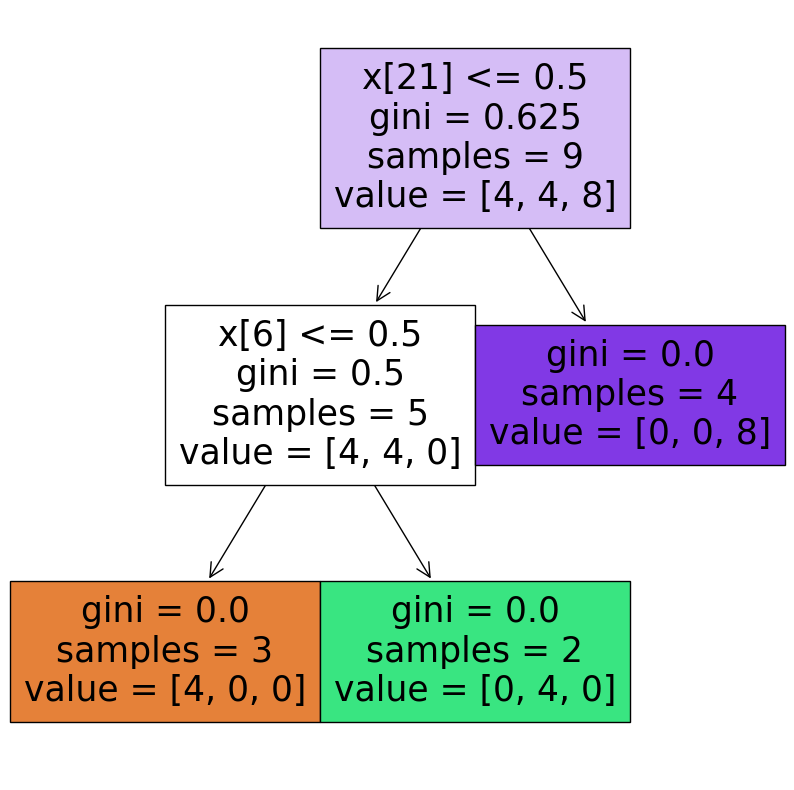

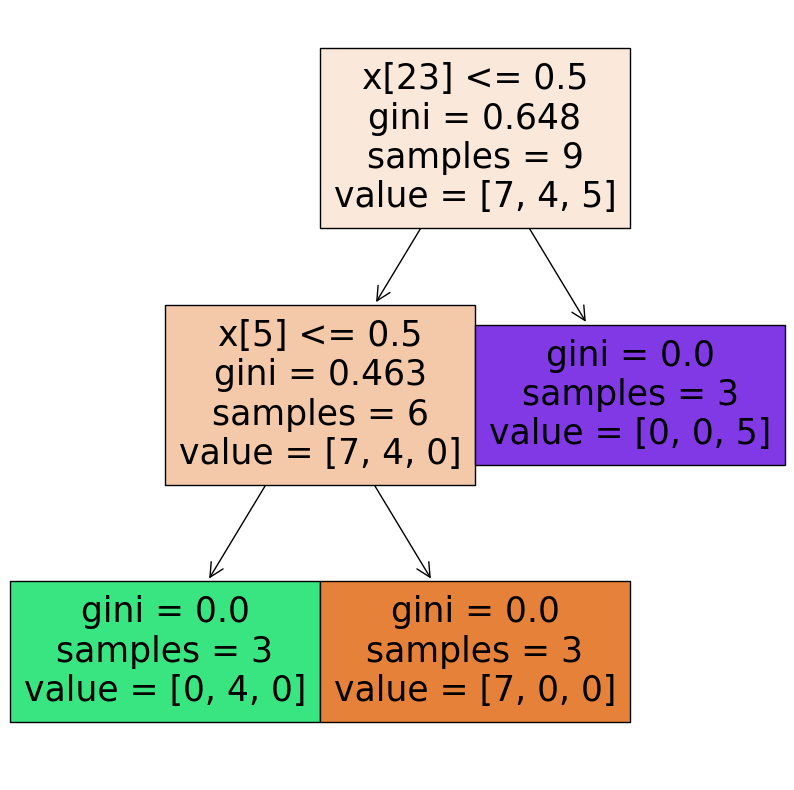

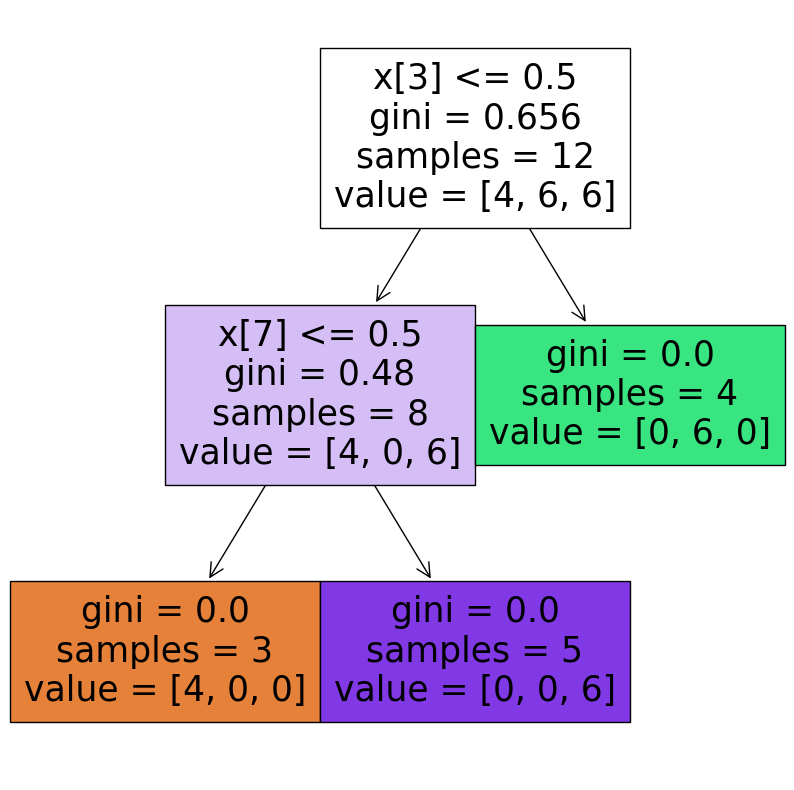

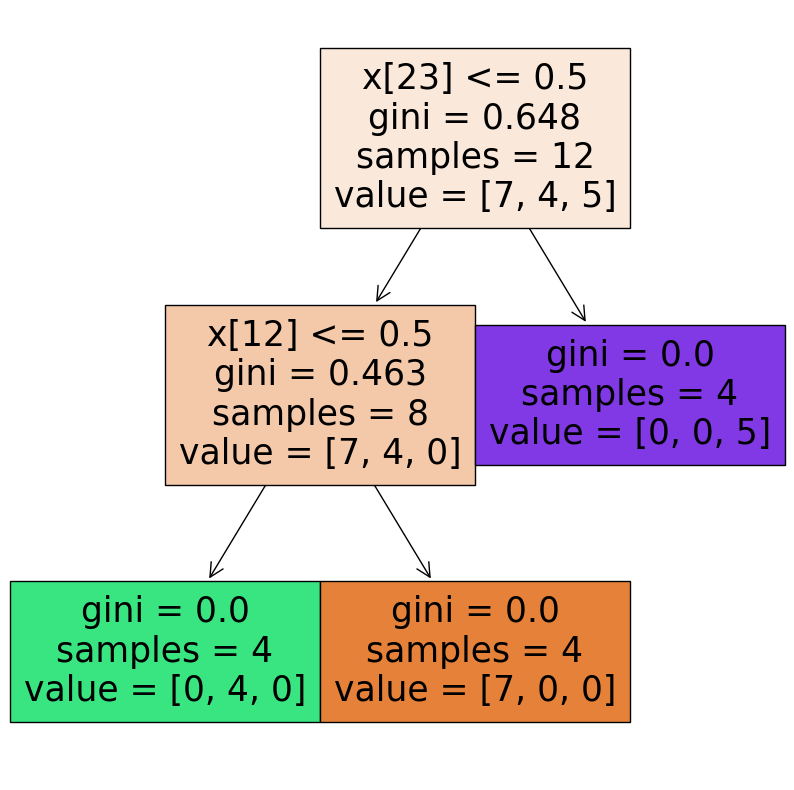

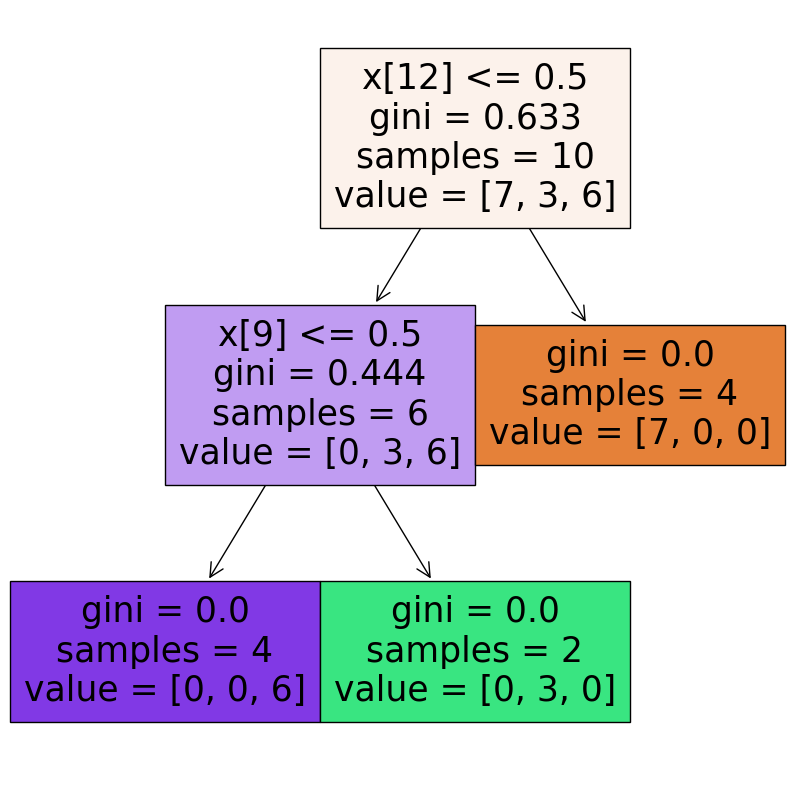

...

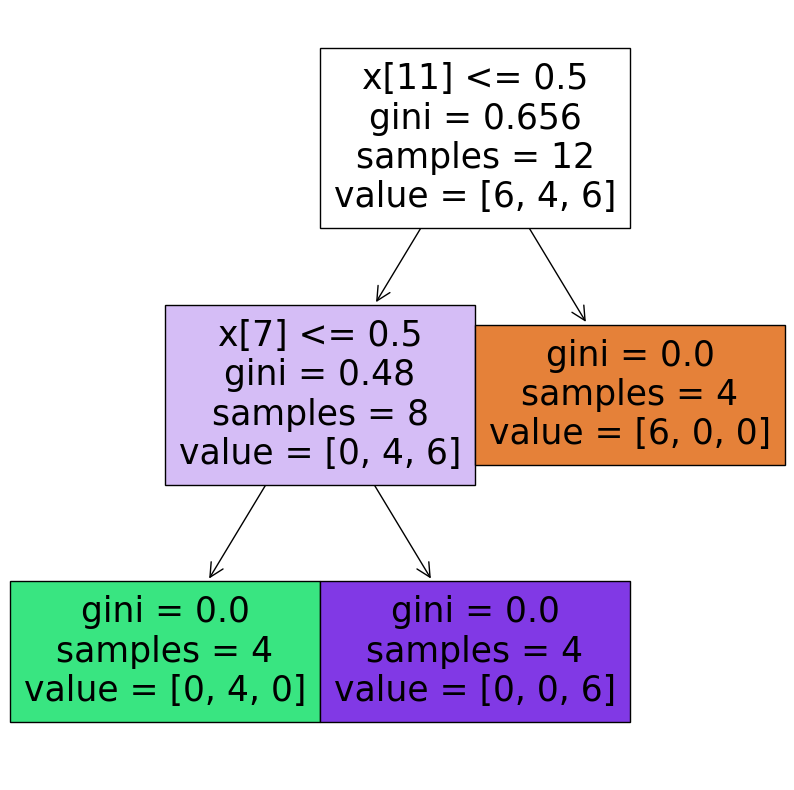

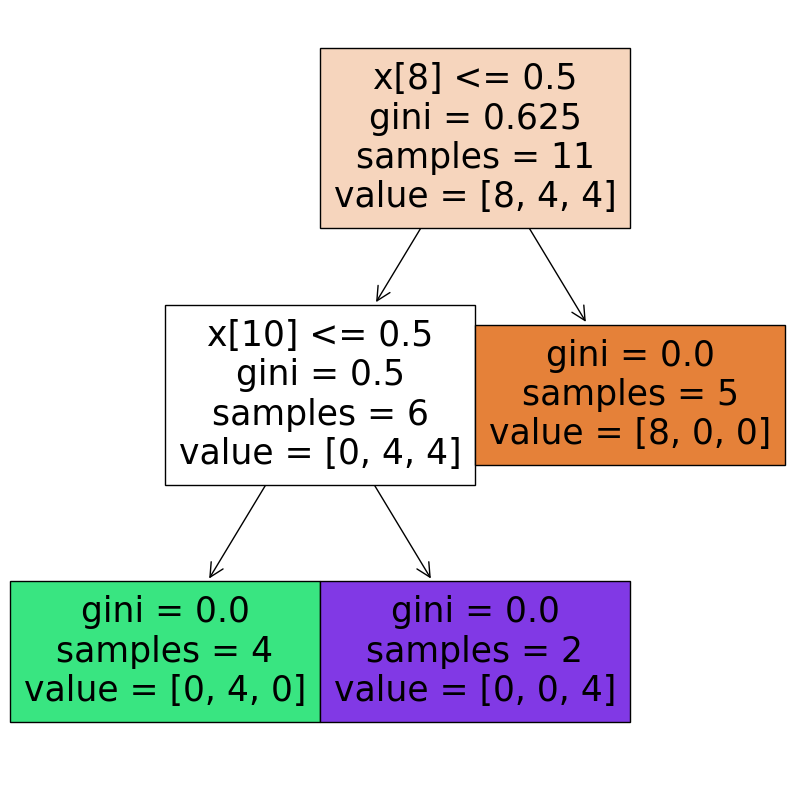

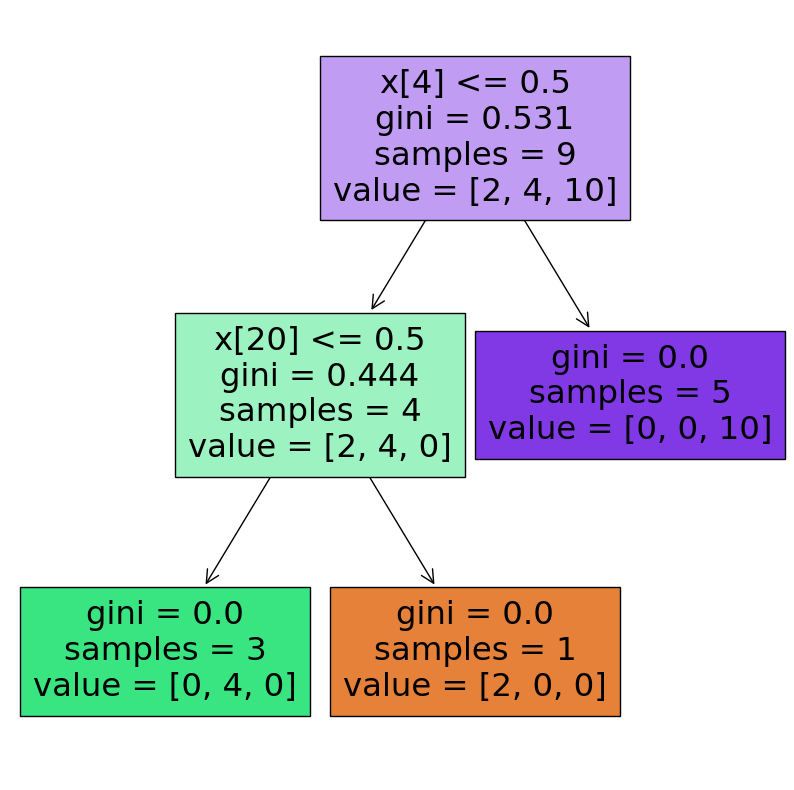

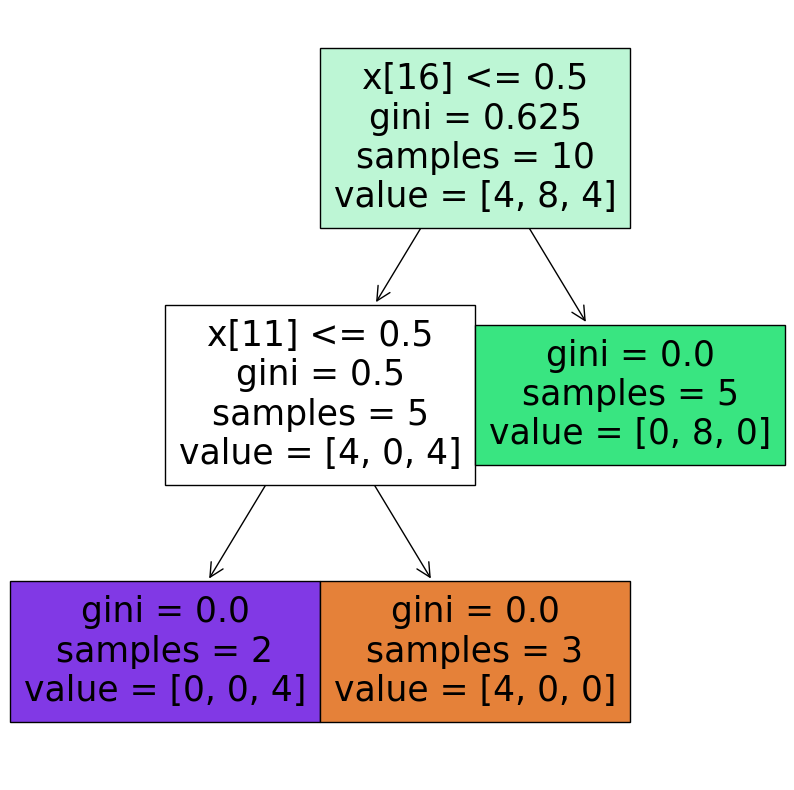

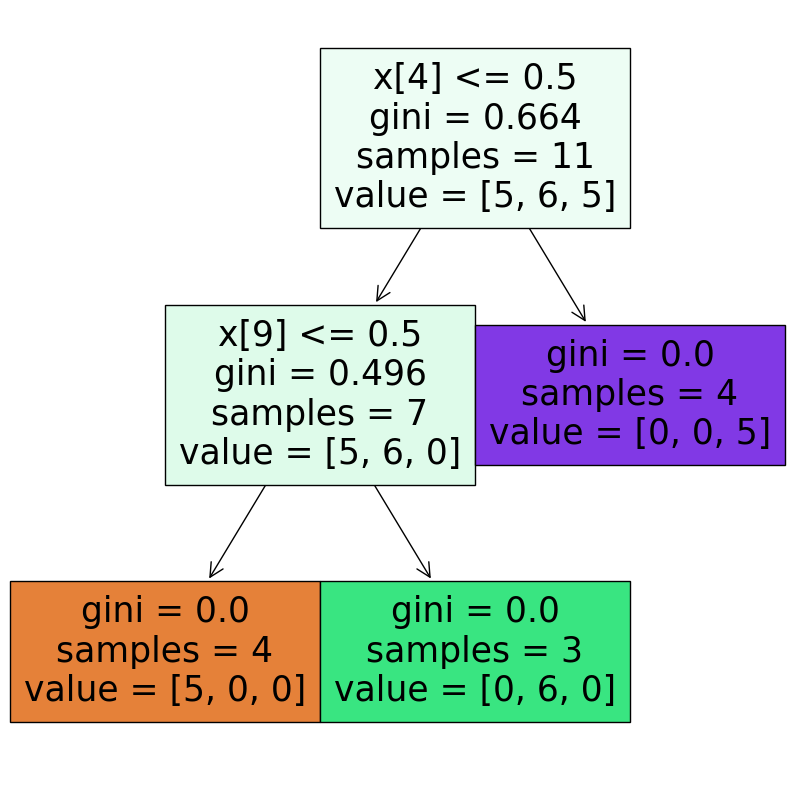

In [10]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

trees = rf_model.estimators_

# Visualize each decision tree
for i, tree in enumerate(trees):
    fig, ax = plt.subplots(figsize=(10, 10))  # Adjust size as needed
    plot_tree(tree, filled=True, ax=ax)
    plt.show()


In [11]:
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Accuracy:", accuracy_rf)

Random Forest Accuracy: 1.0


In [12]:
adaboost_model = AdaBoostClassifier(random_state=42)
adaboost_model.fit(X_train, y_train)

AdaBoostClassifier(random_state=42)

In [13]:
for i, tree in enumerate(adaboost_model.estimators_):
    print(f"Decision Stump {i+1}:")
    print(tree.tree_.threshold)
    print(tree.tree_.value)
    print()

Decision Stump 1:
[ 0.5 -2.  -2. ]
[[[0.3125 0.3125 0.375 ]]

 [[0.3125 0.3125 0.    ]]

 [[0.     0.     0.375 ]]]

Decision Stump 2:
[ 0.5 -2.  -2. ]
[[[4.99998558e-01 4.99998558e-01 2.88372211e-06]]

 [[4.99998558e-01 0.00000000e+00 2.88372211e-06]]

 [[0.00000000e+00 4.99998558e-01 0.00000000e+00]]]

Decision Stump 3:
[ 0.5 -2.  -2. ]
[[[4.99915598e-01 1.68803343e-04 4.99915598e-01]]

 [[0.00000000e+00 1.68803343e-04 4.99915598e-01]]

 [[4.99915598e-01 0.00000000e+00 0.00000000e+00]]]

Decision Stump 4:
[ 0.5 -2.  -2. ]
[[[4.34731264e-05 4.99978263e-01 4.99978263e-01]]

 [[4.34731264e-05 4.99978263e-01 0.00000000e+00]]

 [[0.00000000e+00 0.00000000e+00 4.99978263e-01]]]

Decision Stump 5:
[ 0.5 -2.  -2. ]
[[[4.99965832e-01 4.99965832e-01 6.83362638e-05]]

 [[4.99965832e-01 0.00000000e+00 6.83362638e-05]]

 [[0.00000000e+00 4.99965832e-01 0.00000000e+00]]]

Decision Stump 6:
[ 0.5 -2.  -2. ]
[[[4.99970614e-01 5.87716388e-05 4.99970614e-01]]

 [[4.99970614e-01 5.87716388e-05 0.000000

In [14]:
y_pred_adaboost = adaboost_model.predict(X_test)
accuracy_adaboost = accuracy_score(y_test, y_pred_adaboost)
print("AdaBoost Accuracy:", accuracy_adaboost)

AdaBoost Accuracy: 1.0


In [24]:
y_test

0     Computer Science
17      Graphic Design
15    Computer Science
1            Marketing
Name: Preferred Course, dtype: object

In [25]:
y_pred_adaboost

array(['Computer Science', 'Graphic Design', 'Computer Science',
       'Marketing'], dtype=object)

In [27]:
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
xgb_model = xgb.XGBClassifier()

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable for training data
y_train_encoded = label_encoder.fit_transform(y_train)
# Fit the XGBoost model with the encoded target variable
y_test_encoded=label_encoder.fit_transform(y_test)
xgb_model.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [28]:
y_pred_xgb = xgb_model.predict(X_test)

In [29]:
y_test

0     Computer Science
17      Graphic Design
15    Computer Science
1            Marketing
Name: Preferred Course, dtype: object

In [30]:
y_pred_xgb

array([0, 1, 0, 2], dtype=int64)

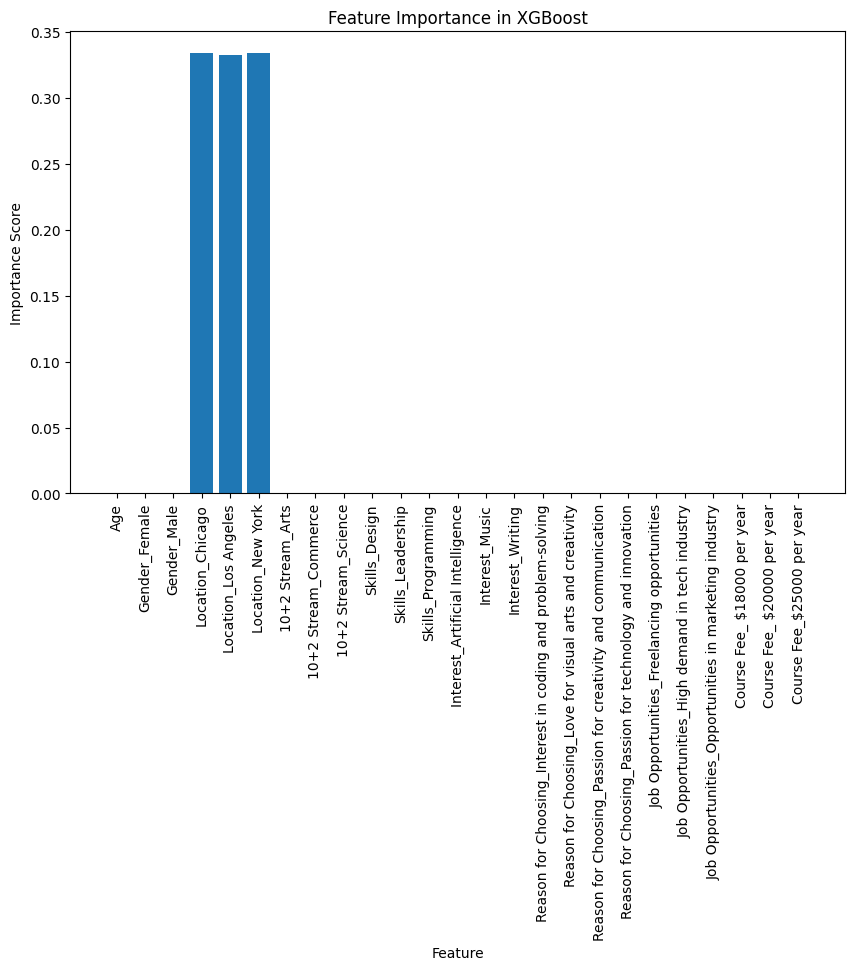

In [31]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(xgb_model.feature_importances_)), xgb_model.feature_importances_)
plt.xticks(range(len(X_train.columns)), X_train.columns, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('Feature Importance in XGBoost')
plt.show()

In [32]:
accuracy_xgb = accuracy_score(y_test_encoded, y_pred_xgb)
print("XGBoost Accuracy:", accuracy_xgb)

XGBoost Accuracy: 1.0
